# Tarea 1: Minimos cuadrados

En esta tarea se abordaran diferentes problemas con los que cotidianamente un cientifico de datos se podria encontrar. Todos pueden ser solucionados usando modelos lineales y la solucion de minimos cuadrados. En este notebook vamos a encontrar dos modelamientos del bitcoin y un logo de BATMAN (A que no te lo esperabas!)

### 1. which conditions should meet matrices $A$ and $b$ to be solvable from the least squares perspective.

Para que $(A^TA)$ sea invertible, es necesario que $A$ tenga rango completo.

### 2.Use a least squares for non-linear models adjust the bitcoin price and perform a prediction using the model to determine the future daily price a week ahead, compare with the actual values.

En primer lugar se cargan los datos, para este caso, como se quiere hacer la prediccion con una semana de antelacion, los datos son el promedio de cada semana. 
Las variables rezagadas son las variables en la semana anterior.

Debido a la relacion encontrada entre Bitcoin y otras criptomonedas como ETH y Doge, se realizan transformaciones para poder correr el modelo lineal. En este caso la raiz cuadrada de ETH muestra buen comportamiento, al igual que el logaritmo natural de Doge.

In [4]:
using CSV
using DataFrames
Bitcoin = CSV.read("C:\\Users\\Julian\\Downloads\\BitcoinJulian.csv",DataFrame)

,Semana,Bitcoin,RAIZ(ETH_rezagado),Ln(Doge_rezagado),Low_rezagado,High_rezagado
,Int64,Float64,Float64,Float64,Float64,Float64
1,307,6.44e11,4.79839e5,24.2134,32274.2,34932.2
2,306,6.35e11,5.01988e5,24.2584,34203.8,37107.0
3,305,6.63e11,5.38562e5,24.4716,36046.7,38926.5
4,304,7.14e11,5.57126e5,24.6005,34818.3,37445.0
5,303,6.75e11,5.47297e5,24.4759,35310.9,38431.3
6,302,6.89e11,5.37417e5,24.541,33870.3,40701.9
7,301,7.07e11,6.49335e5,24.8722,45743.1,50500.6
8,300,8.78e11,6.61483e5,25.046,55115.8,58564.1
9,299,1.07e12,587178.0,24.6405,54630.3,57397.5


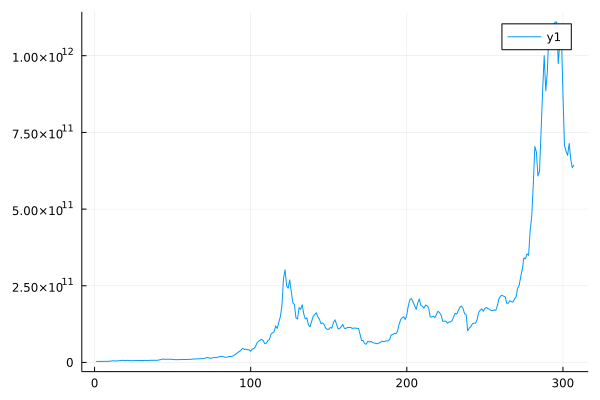

In [11]:
using Plots

plot(Bitcoin.Semana,Bitcoin.Bitcoin)
#plot(Bitcoin.Bitcoin,Bitcoin."RAIZ(ETH_rezagado)",seriestype = :scatter)

Ahora seleccionamos todos los datos menos el ultimo, que nos va a servir para determinar si fue buena o mala la prediccion. El objetivo seria que el modelo arrojara un valor de 6.44e11 para la semana 307. 

In [34]:
A=Bitcoin[2:307,:]
X=Matrix(A[:,3:7])
Y=Array(A[:,2])

306-element Vector{Float64}:
 6.35e11
 6.63e11
 7.14e11
 6.75e11
 6.89e11
 7.07e11
 8.78e11
 1.07e12
 1.04e12
 9.74e11
 1.11e12
 1.11e12
 1.1e12
 ⋮
 5.606229337e9
 4.965767285e9
 4.135436505e9
 3.861201454e9
 3.605758299e9
 3.512219659e9
 3.440056322e9
 3.369960674e9
 3.429188469e9
 3.42649678e9
 3.323798914e9
 3.289845268e9

Como es un modelo lineal tiene solucion, siendo $B=(X^TX)^{-1}X^TY$

In [35]:
B = inv(transpose(X)*X)*transpose(X)*Y

5-element Vector{Float64}:
 -105008.85975869
       2.3605751351550293e8
       5.264411701501465e7
       8.476165484564209e7
      -1.1849520940864311e8

Miramos que el modelo predice datos muy parecidos a los reales, sin embargo eso no garantiza que haga una buena prediccion en la ultima semana

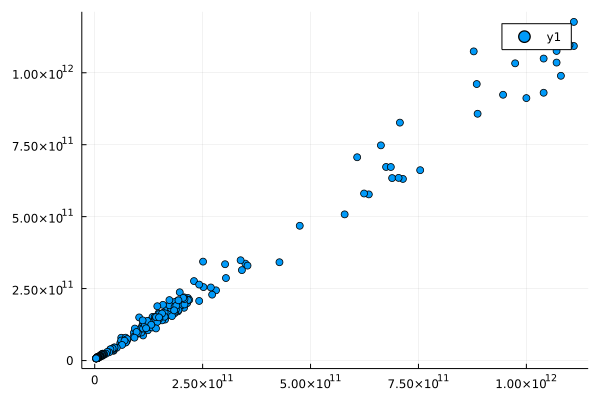

In [50]:
Yfit=X*B
plot(Y,Yfit,seriestype = :scatter)

Segun nuestro modelo, cual sera el precio del bitcoin promedio de la proxima semana?

In [61]:
prediccion = dot((Array(Bitcoin[1,3:7])),B)

6.559458349557612e11

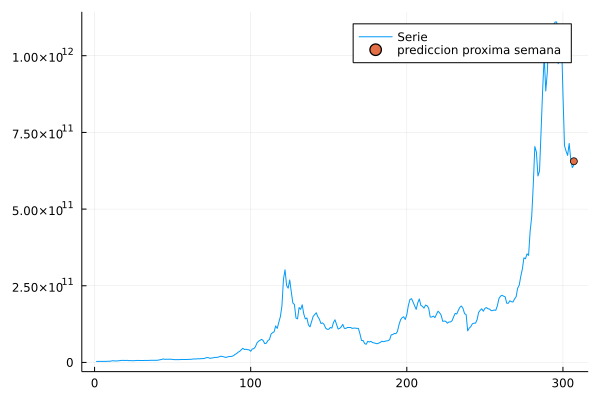

In [75]:
plot(Bitcoin.Semana,Bitcoin.Bitcoin,label = "Serie")
plot!([307],[prediccion],seriestype = :scatter,label = "prediccion proxima semana")
#plot(307,prediccion)

Finalmente veamos el ajuste del modelo

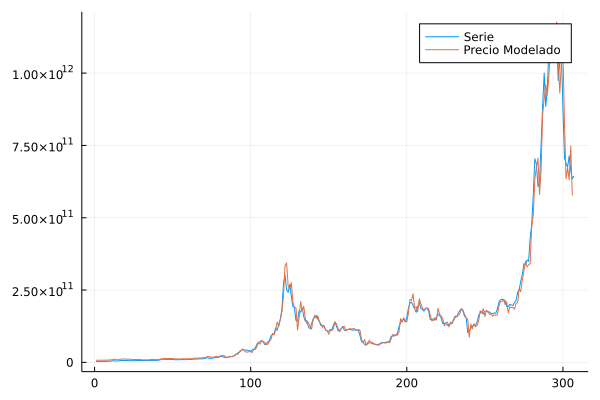

In [74]:
plot(Bitcoin.Semana,Bitcoin.Bitcoin,label = "Serie")
plot!(Bitcoin.Semana[2:307],Yfit, label = "Precio Modelado")

# No se ve nada mal!

### 3. Use least squares to determine the relationship between the bitcoin price and prices of three comodities namely, oil, silved and gold, during the last year.

Para este caso vamos a ver la relacion del Bitcoin con diferentes criptomonedas, ETH, Doge, Litecoin y USDcoin

In [77]:
Bitcoin = CSV.read("C:\\Users\\Julian\\Downloads\\Cripto.csv",DataFrame)

,Dia,Bitcoin,ETH,USDcoin,Doge,Litecoin
,Int64,Float64,Float64,Float64,Float64,Int64
1,995,6.41899e11,2.71029e11,2.56732e10,3.05525e10,9277626785
2,994,6.32696e11,2.56298e11,2.55472e10,3.01834e10,9216722526
3,993,6.61575e11,2.70622e11,2.55117e10,3.21177e10,9672815313
4,992,6.4994e11,2.59448e11,2.55044e10,3.21049e10,9364007879
5,991,6.35451e11,2.50553e11,2.53978e10,3.19493e10,9141322350
6,990,6.29339e11,2.46278e11,2.52131e10,3.18528e10,9183632148
7,989,6.56853e11,2.65001e11,2.51628e10,3.3111e10,9621414741
8,988,6.72333e11,2.51716e11,2.52473e10,3.42215e10,9592516724
9,987,6.45443e11,2.42239e11,2.54593e10,3.34465e10,9169836136


Al igual que en el caso anterior miramos las relaciones entre cada una de las variables y ajustamos una funcion para mejorar la linealidad.

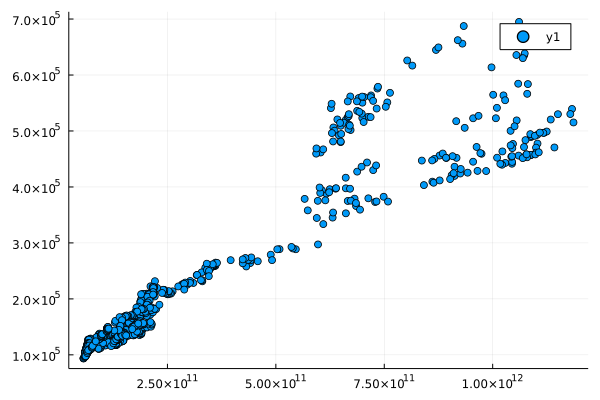

In [87]:
plot(Bitcoin.Bitcoin,sqrt.(Bitcoin.ETH),seriestype = :scatter)

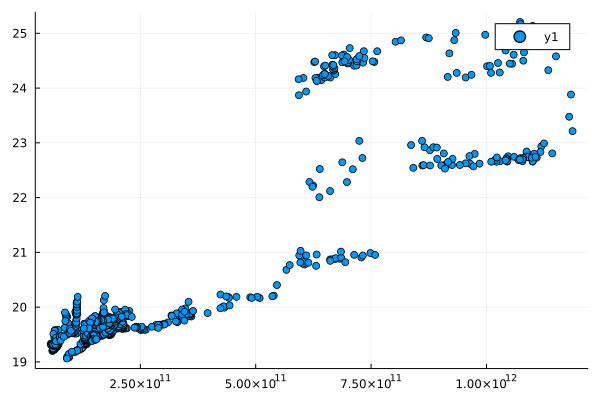

In [88]:
plot(Bitcoin.Bitcoin,log.(Bitcoin.Doge),seriestype = :scatter)

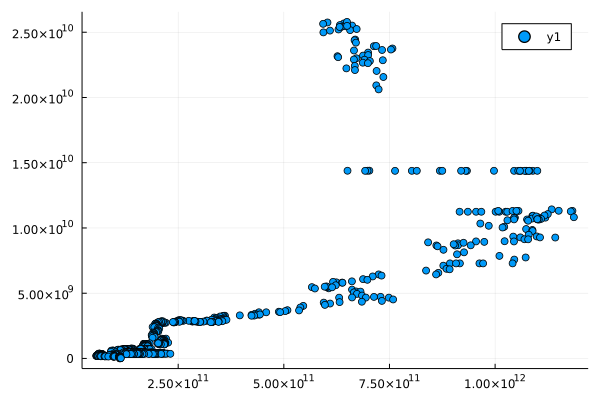

In [89]:
plot(Bitcoin.Bitcoin,(Bitcoin.USDcoin),seriestype = :scatter)

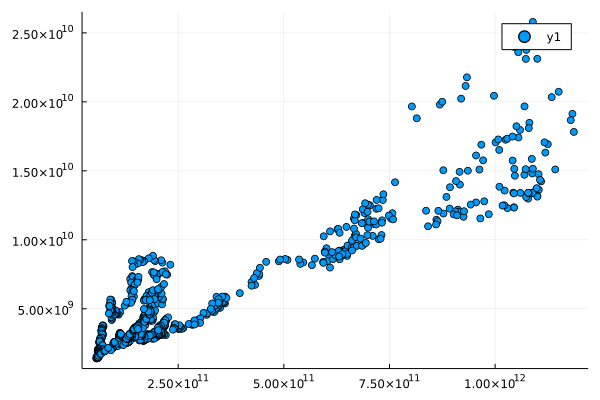

In [90]:
plot(Bitcoin.Bitcoin,(Bitcoin.Litecoin),seriestype = :scatter)

USDcoin y Litecoin no necesitaban transformaciones por lo que las dejamos tal cual.

In [93]:
Y = Array(Bitcoin.Bitcoin)
X = Matrix([ones(995) sqrt.(Bitcoin.ETH) log.(Bitcoin.Doge) Bitcoin.USDcoin Bitcoin.Litecoin])

995×5 Matrix{Float64}:
 1.0       5.20604e5  24.1427  2.56732e10  9.27763e9
 1.0       5.06259e5  24.1306  2.55472e10  9.21672e9
 1.0       5.20213e5  24.1927  2.55117e10  9.67282e9
 1.0       5.0936e5   24.1923  2.55044e10  9.36401e9
 1.0       5.00553e5  24.1874  2.53978e10  9.14132e9
 1.0  496264.0        24.1844  2.52131e10  9.18363e9
 1.0       5.14782e5  24.2231  2.51628e10  9.62141e9
 1.0       5.01713e5  24.2561  2.52473e10  9.59252e9
 1.0       4.92178e5  24.2332  2.54593e10  9.16984e9
 1.0       4.80077e5  24.2622  2.5792e10   8.83454e9
 1.0  461542.0        24.1849  2.57481e10  8.45468e9
 1.0       4.5949e5   24.1615  2.56447e10  8.38996e9
 1.0       4.81154e5  24.2557  2.54887e10  8.97717e9
 ⋮                                         
 1.0       1.44917e5  20.0093  1.25259e8   3.05927e9
 1.0       1.4459e5   19.9577  1.25705e8   3.06835e9
 1.0       1.44358e5  19.8881  8.54234e7   3.07569e9
 1.0       1.44747e5  19.939   8.55971e7   3.09147e9
 1.0  144904.0        20.0033  0

In [94]:
B = inv(transpose(X)*X)*transpose(X)*Y

5-element Vector{Float64}:
  -8.886890565357031e10
   2.2074228690432534e6
  -6.437665364649414e9
 -13.993391989672773
  12.900145544669305

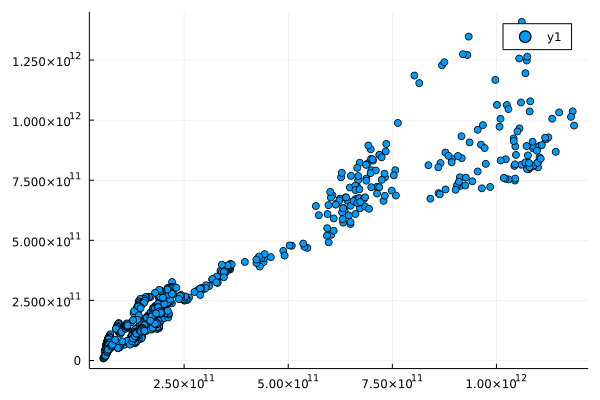

In [95]:
Yfit=X*B
plot(Y,Yfit,seriestype = :scatter)

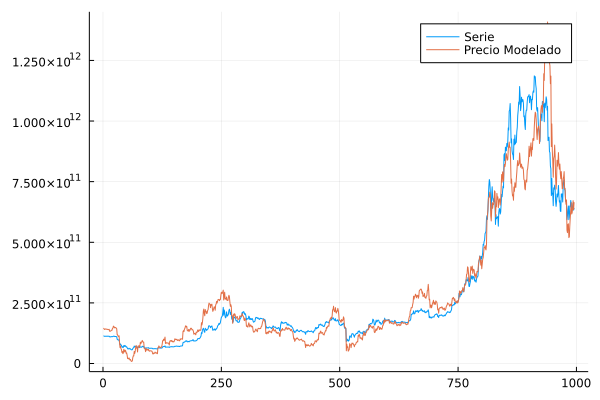

In [96]:
plot(Bitcoin.Dia,Bitcoin.Bitcoin,label = "Serie")
plot!(Bitcoin.Dia,Yfit, label = "Precio Modelado")

Estaba mejorcito el modelo anterior :(, es decir que no tienen una relacion tan fuerte con las criptomonedas utilizadas. En especial, se diferenciaron bastante en el pico que tuvo bitcoin cerca al dia 800.

## 4. Solve the point set registration problem.

Para analizar el problema usaremos el logo de batman

In [98]:
batman = CSV.read("C:\\Users\\Julian\\Downloads\\batman.csv",DataFrame)

,Column1,Y1,Y2,X1,X2,Z1,Z2
,Int64,Float64,Float64,Float64,Float64,Float64,Float64
1,1,-4.496,2.2994,-2.13274,2.65006,0.715429,2.65697
2,2,3.549,-1.54055,4.71292,0.728919,3.014,1.55984
3,3,-5.533,-1.83766,-4.65106,0.580616,0.419143,1.47495
4,4,-2.245,-1.68229,-0.0960248,0.657608,1.35857,1.51934
5,5,-5.013,2.09386,-3.22647,2.54737,0.567714,2.59825
6,6,5.379,-1.91981,12.9908,0.540612,3.53686,1.45148
7,7,-3.541,-1.53416,-0.818386,0.733706,0.988286,1.56167
8,8,5.62,1.78851,14.519,2.39368,3.60571,2.511
9,9,1.749,0.822753,1.04098,1.91142,2.49971,2.23507


Tenemos dos transformaciones del logo, la verde es lineal y por la cual iniciaremos, la segunda no lineal.

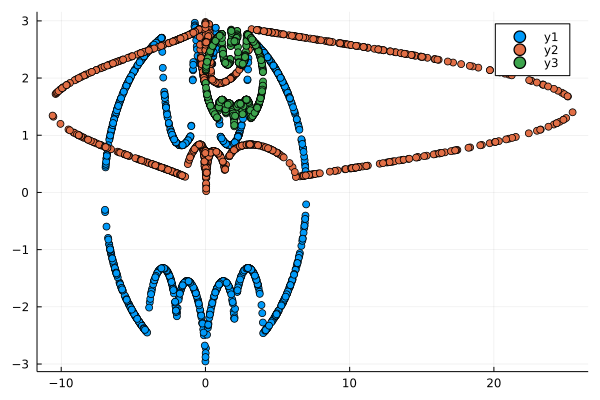

In [102]:
plot(batman.Y1,batman.Y2,seriestype = :scatter)
plot!(batman.X1,batman.X2,seriestype = :scatter)
plot!(batman.Z1,batman.Z2,seriestype = :scatter)

Definimos Y como nuestro logo objetivo

In [114]:
Y = Matrix([batman.Y1 batman.Y2])

2-element Vector{Float64}:
 124.72248113311409
  57.98663135587748

Definimos la funcion $f1$ la cual va a transformar independientemente las coordenadas x, y del logo transformado.

In [245]:
function f1(C)
  x =ones(1000) * C[1] + X[:,1] * C[2]
  y =ones(1000) * C[3] + X[:,2] * C[4]
  Yfit = [x y]
    e = Y - Yfit
  return (sum( (norm.(eachrow(e)).^2) ))
end

f1 (generic function with 1 method)

Probamos que funcione $f1$

In [246]:
X = Matrix([batman.Z1 batman.Z2])
C1 = Vector(1:4)
CC = C1
f1(C1)

149177.27059268393

Usamos la minimizacion de la libreria Optim

In [216]:
using Optim
sol = optimize(f1,zeros(4))

 * Status: success

 * Candidate solution
    Final objective value:     8.459685e-09

 * Found with
    Algorithm:     Nelder-Mead

 * Convergence measures
    √(Σ(yᵢ-ȳ)²)/n ≤ 1.0e-08

 * Work counters
    Seconds run:   0  (vs limit Inf)
    Iterations:    225
    f(x) calls:    403


In [250]:
print(Optim.summary(sol))
C = Optim.minimizer(sol)
Optim.iterations(sol)


Nelder-Mead

225

Creamos el Gif, truncando las iteraciones y graficando.

┌ Info: Saved animation to 
│   fn = C:\Users\Julian\Downloads\tmp.gif
└ @ Plots C:\Users\Julian\.julia\packages\Plots\zozYv\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\Julian\\Downloads\\tmp.gif")
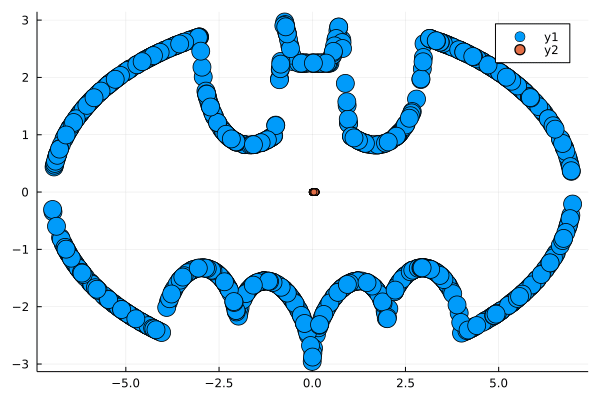

In [249]:
@gif for i=1:225
   sol = optimize(f1,zeros(4),iterations = i)
    C = Optim.minimizer(sol)
    x =ones(1000) * C[1] + X[:,1] * C[2]
  y =ones(1000) * C[3] + X[:,2] * C[4]
  Yfit = [x y]
plot(batman.Y1,batman.Y2,seriestype = :scatter,markersize = 10)
plot!(Yfit[:,1],Yfit[:,2],seriestype = :scatter)
end 

Ahora vamos con la transformacion lineal, pero seguiremos usando un modelo lineal para lograr el logo original. Esto, debido a que seria "inutil" incluir la transformacion no lineal con la que fueron alterados los datos ya que en la practica no se conoceria

┌ Info: Saved animation to 
│   fn = C:\Users\Julian\Downloads\tmp.gif
└ @ Plots C:\Users\Julian\.julia\packages\Plots\zozYv\src\animation.jl:114


Plots.AnimatedGif("C:\\Users\\Julian\\Downloads\\tmp.gif")
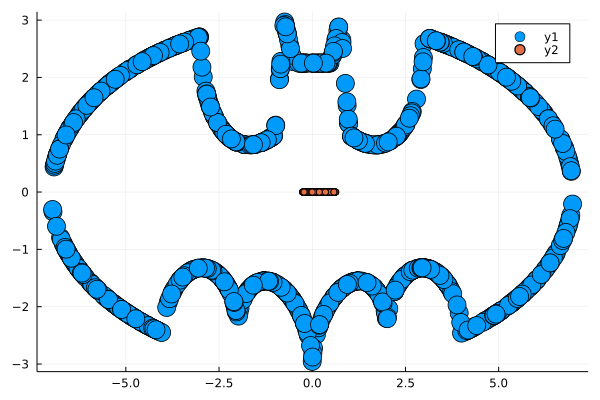

In [252]:
X = Matrix([batman.X1 batman.X2])
@gif for i=1:225
   sol = optimize(f1,zeros(4),iterations = i)
    C = Optim.minimizer(sol)
    x =ones(1000) * C[1] + X[:,1] * C[2]
  y =ones(1000) * C[3] + X[:,2] * C[4]
  Yfit = [x y]
plot(batman.Y1,batman.Y2,seriestype = :scatter,markersize = 10)
plot!(Yfit[:,1],Yfit[:,2],seriestype = :scatter)
end 

### No estuvo tan mal !